In [1]:
# Initial imports

In [1]:
import panel as pn
pn.extension('plotly')
import numpy as np
import plotly.express as px
import pandas as pd
import hvplot.pandas
import matplotlib.pyplot as plt
import os
import csv
import plotly.graph_objects as go
import pandas as pd
import folium 
from pathlib import Path
from dotenv import load_dotenv

In [ ]:
#Import the CSVs to Pandas DataFrames

In [2]:
csvpath = Path("Resources/team_stats/psg_result.csv")
csvpath2 = Path("Resources/team_stats/win_table.csv")
csvpath3 = Path("Resources/team_stats/goal_diff_table.csv")
csvpath4 = Path("Resources/team_stats/points_total.csv")
csvpath5 = Path("Resources/team_stats/attendance.csv")
csvpath6 = Path("Resources/player_stats/player_sum_2.csv")
csvpath7 = Path("Resources/player_stats/psg_transfer_player_stats.csv")
csvpath8 = Path("Resources/player_stats/standard_stats_top_goal.csv")
csvpath9 = Path("Resources/transfer_data.csv")

In [3]:
#For team perofrmance assign, csv Paths
psg_results = pd.read_csv(csvpath)
win_data = pd.read_csv(csvpath2)
goal_diff = pd.read_csv(csvpath3)
points_total = pd.read_csv(csvpath4)
attendance = pd.read_csv(csvpath5)

In [4]:
# Section 1, team win data and accompanied data/data cleaning/graphs
#Plot PSG wins
psg_wins = psg_results.hvplot.line(x="season", y="wins", rot=90, height=500, width=500)
psg_wins

:Curve   [season]   (wins)

In [5]:
#Plot win data for all teams
win_data = win_data.set_index("season")
win_data

,Paris S-G,Monaco,Saint-Étienne,Lille,Manchester City,Liverpool,Chelsea,Arsenal,Bayern Munich,Dortmund,Schalke 04,Leverkusen,Juventus,Roma,Napoli,Fiorentina,Atlético Madrid,Barcelona,Real Madrid,Athletic Club
season,,,,,,,,,,,,,,,,,,,,
2010-2011,15,9,12,21,21,17,21,19,19,23,11,20,15,18,21,12,17,30,29,18
2011-2012,23,0,16,21,28,14,18,21,23,25,20,15,23,16,16,11,15,28,32,12
2012-2013,25,0,16,16,23,16,22,21,29,19,16,19,27,18,23,21,23,32,26,12
2013-2014,27,23,20,20,27,26,25,24,29,22,19,19,33,26,23,19,28,27,27,20
2014-2015,24,20,19,16,24,18,26,22,25,13,13,17,26,19,18,18,23,30,30,15
2015-2016,30,17,17,15,19,16,12,20,28,24,15,18,29,23,25,18,28,29,28,18
2016-2017,27,30,12,13,23,22,30,23,25,18,11,11,29,28,26,16,23,28,29,19
2017-2018,29,24,15,10,32,21,21,19,27,15,18,15,30,23,28,16,23,28,22,10
2018-2019,29,8,19,22,32,30,21,21,24,23,8,18,28,18,24,8,26,26,21,13


In [6]:
team_win_data = win_data.hvplot.line(x="season", y=["Paris S-G", "Monaco", "Saint-Étienne", "Lille"], 
                                     rot=90, height=750, width=1000)
team_win_data

:NdOverlay   [Variable]
   :Curve   [season]   (value)

In [7]:
# Calculate mean of wins across 10 seasons for PSG data, and all competitors
win_data["Mean"] = win_data.mean(axis=1, skipna=True)
psg_vs_avg = win_data[["Paris S-G", "Mean"]].copy()
psg_vs_avg

,Paris S-G,Mean
season,,
2010-2011,15,18.40
2011-2012,23,18.85
2012-2013,25,20.20
2013-2014,27,24.20
2014-2015,24,20.80
2015-2016,30,21.45
2016-2017,27,22.15
2017-2018,29,21.30
2018-2019,29,20.95


In [8]:
#plot team wins vs. psg on hv plot
psg_vs_avg_plot = psg_vs_avg.hvplot.line(x="season", y=["Paris S-G", "Mean"], 
                                     rot=90, height=500, width=750,
                                     title = "Team wins per seasons versus competitors",
                                     value_label = "total wins",
                                     legend='top_left'
                                        )
psg_vs_avg_plot

:NdOverlay   [Variable]
   :Curve   [season]   (total wins)

In [9]:
# creatre goal difference table
goal_diff_table = goal_diff.set_index("season")
goal_diff_table

,Paris S-G,Monaco,Saint-Étienne,Lille,Manchester City,Liverpool,Chelsea,Arsenal,Bayern Munich,Dortmund,...,Leverkusen,Juventus,Roma,Napoli,Fiorentina,Atlético Madrid,Barcelona,Real Madrid,Athletic Club,Unnamed: 21
season,,,,,,,,,,,,,,,,,,,,,
2010-2011,15,-19,-1,32,27,15,36,29,41,45,...,20,10,7,20,5,9,74,69,4,NaN
2011-2012,34,0,4,33,64,7,19,25,55,55,...,8,48,6,20,-6,7,85,89,-3,NaN
2012-2013,46,0,28,19,32,28,36,35,80,39,...,26,47,15,37,28,34,75,61,-21,NaN
2013-2014,61,40,22,20,65,51,44,27,71,42,...,19,57,47,38,21,51,67,66,27,NaN
2014-2015,47,76,21,1,45,4,41,35,62,5,...,25,48,23,16,15,38,89,80,1,NaN
2015-2016,83,7,5,12,30,13,6,29,63,48,...,16,55,42,48,18,45,83,76,13,NaN
2016-2017,56,25,-1,-7,41,36,52,33,67,32,...,-2,50,52,55,6,43,79,65,10,NaN
2017-2018,79,32,-3,-26,79,46,24,23,64,17,...,14,62,33,48,8,36,70,50,-8,NaN
2018-2019,70,-4,18,35,72,67,24,22,56,37,...,17,40,18,38,2,26,54,17,-4,NaN


In [10]:
#Plot goal difference table
goal_diff_french = goal_diff_table.hvplot.line(x="season", y=["Paris S-G", "Monaco", "Saint-Étienne", "Lille"], 
                                     rot=90, height=750, width=1000)
goal_diff_french

:NdOverlay   [Variable]
   :Curve   [season]   (value)

In [11]:
#Capture goal difference table as PSG vs. mean of all teams
goal_diff_table["Mean"] = goal_diff_table.mean(axis=1, skipna=True)
psg_vs_avg_gd = goal_diff_table[["Paris S-G", "Mean"]].copy()
psg_vs_avg_gd

,Paris S-G,Mean
season,,
2010-2011,15,21.60
2011-2012,34,29.00
2012-2013,46,32.65
2013-2014,61,42.80
2014-2015,47,33.70
2015-2016,83,34.70
2016-2017,56,34.85
2017-2018,79,33.20
2018-2019,70,29.35


In [12]:
#Plot goal difference table
psg_vs_avg_gd_plot = psg_vs_avg_gd.hvplot.line(x="season", y=["Paris S-G", "Mean"], 
                                     rot=90, height=500, width=750,
                                     value_label='Goal Differential of PSG vs. Competitors Average',
                                     title = "Goal Differential",
                                     legend='top_left'
                                              ) 
psg_vs_avg_gd_plot

:NdOverlay   [Variable]
   :Curve   [season]   (Goal Differential of PSG vs. Competitors Average)

In [13]:
#Create table of total points for all teams across 10 seasons
total_points_data = points_total.set_index("season")
total_points_data 

,Paris S-G,Monaco,Saint-Étienne,Lille,Manchester City,Liverpool,Chelsea,Arsenal,Bayern Munich,Dortmund,Schalke 04,Leverkusen,Juventus,Roma,Napoli,Fiorentina,Atlético Madrid,Barcelona,Real Madrid,Athletic Club
season,,,,,,,,,,,,,,,,,,,,
2010-2011,60,44,49,76,71,58,71,68,65,75,40,68,58,63,70,51,58,96,92,58
2011-2012,79,0,57,74,89,52,64,70,73,81,64,54,84,56,61,46,56,91,100,49
2012-2013,83,0,63,62,78,61,75,73,91,66,55,65,87,62,78,70,76,100,85,45
2013-2014,89,80,69,71,86,84,82,79,90,71,64,61,102,85,78,65,90,87,87,70
2014-2015,83,71,69,56,79,62,87,75,79,46,48,61,87,70,63,64,78,94,92,55
2015-2016,96,65,58,60,66,60,50,71,88,78,52,60,91,80,82,64,88,91,90,62
2016-2017,87,95,50,46,78,76,93,75,82,64,43,41,91,87,86,60,78,90,93,63
2017-2018,93,80,55,38,100,75,70,63,84,55,63,55,95,77,91,57,79,93,76,43
2018-2019,91,36,66,75,98,97,72,70,78,76,33,58,90,66,79,41,76,87,68,53


In [14]:
#create new table to show mean of total points of PSG, vs. all other teams
total_points_data["Mean"] = total_points_data.mean(axis=1, skipna=True)
points_psg_vs_avg = total_points_data[["Paris S-G", "Mean"]].copy()
points_psg_vs_avg

,Paris S-G,Mean
season,,
2010-2011,60,64.55
2011-2012,79,65.00
2012-2013,83,68.75
2013-2014,89,79.50
2014-2015,83,70.95
2015-2016,96,72.60
2016-2017,87,73.90
2017-2018,93,72.10
2018-2019,91,70.50


In [15]:
#plot psg vs. teams total point on graph using hv plot
points_psg_vs_avg_plot = points_psg_vs_avg.hvplot.line(x="season", y=["Paris S-G", "Mean"], 
                                     rot=90, height=500, width=750,
                                     value_label = "Total Points vs. Competitors Average",   
                                     title = "PSG total points against competitors",
                                     legend='top_left'
                                                      )
points_psg_vs_avg_plot 

:NdOverlay   [Variable]
   :Curve   [season]   (Total Points vs. Competitors Average)

In [16]:
#create table that shows attendance for all teams
attendance_top_teams = attendance.set_index("season")
attendance_top_teams

,Paris S-G,Monaco,Saint-Étienne,Lille,Manchester City,Liverpool,Chelsea,Arsenal,Bayern Munich,Dortmund,Schalke 04,Leverkusen,Juventus,Roma,Napoli,Fiorentina,Atlético Madrid,Barcelona,Real Madrid,Athletic Club
season,,,,,,,,,,,,,,,,,,,,
2010-2011,"29,317","6,905","25,096","16,426","45,905","42,820","41,435","60,025","69,000","79,151","61,320","28,633","21,966","33,952","45,608","23,608","41,526","79,268","71,289","36,042"
2011-2012,"42,891",0,"21,533","16,972","47,045","44,253","41,484","60,000","69,000","80,521","61,218","28,494","37,570","35,757","40,623","21,477","45,236","84,119","74,836","37,605"
2012-2013,"41,030",0,"22,340","37,958","46,974","44,749","41,462","60,079","71,000","80,520","61,171","28,120","38,600","40,179","39,636","25,665","40,868","77,973","68,526","30,737"
2013-2014,"45,420","8,438","30,595","38,662","47,075","44,671","41,482","60,013","71,000","80,297","61,569","28,452","38,328","40,436","40,632","32,057","46,247","72,116","71,558","32,851"
2014-2015,"45,789","7,820","32,256","36,552","45,365","44,659","41,546","59,992","72,882","80,424","61,569","29,311","38,553","40,135","32,266","30,309","46,532","77,632","73,918","41,137"
2015-2016,"46,160","7,838","30,328","30,268","54,041","43,910","41,500","59,944","75,000","81,178","61,386","29,085","38,662","35,182","38,760","28,734","47,113","79,724","71,280","41,945"
2016-2017,"45,160","9,586","25,794","29,487","54,019","53,016","41,508","59,957","75,000","79,653","60,703","28,428","39,936","32,638","36,601","26,470","44,710","78,034","69,426","41,042"
2017-2018,"46,929","9,243","28,142","31,453","54,070","53,049","41,282","59,323","75,000","79,496","61,197","28,415","39,316","37,450","43,050","26,092","55,483","66,603","66,161","37,325"
2018-2019,"46,911","8,447","28,400","34,079","54,130","52,983","40,437","59,899","75,000","80,841","60,941","27,990","37,799","38,622","29,003","31,178","56,216","76,104","61,040","40,664"


In [17]:
#show PSG team attendance in table
attendance_top_teams_table = attendance_top_teams[["Paris S-G"]].copy()
attendance_top_teams_table

,Paris S-G
season,
2010-2011,"29,317"
2011-2012,"42,891"
2012-2013,"41,030"
2013-2014,"45,420"
2014-2015,"45,789"
2015-2016,"46,160"
2016-2017,"45,160"
2017-2018,"46,929"
2018-2019,"46,911"


In [18]:
#Plot PSG attendance
attendance_top_teams_table_plot = attendance_top_teams_table.hvplot.scatter(x="season", y="Paris S-G", 
                                     rot=90, height=500, width=500,                       
                                     value_label = "attendance",   
                                     title = "PSG attendance",  
                                     ) 
attendance_top_teams_table_plot

:Scatter   [season]   (Paris S-G)

In [19]:
# Import data of player transfers
transfers_data = pd.read_csv(csvpath9, index_col="season")
transfers_data.head()

,name,transfer_fee,team_from,from_lat,from_long,team_to,to_lat,to_long,league
season,,,,,,,,,
2013-2014,Mamadou Sakho,19000000,Paris SG,48.8414,2.2530,Liverpool F.C.,53.4308,-2.9608,French
2013-2014,Kevin Gameiro,7500000,Paris SG,48.8414,2.2530,Sevilla FC,37.3841,-5.9707,French
2013-2014,Edinson Cavani,64500000,S.S.C Napoli,40.8279,14.1931,Paris SG,48.8414,2.2530,French
2013-2014,Marquinhos,31400000,A.S. Roma,41.9341,12.4547,Paris SG,48.8414,2.2530,French
2013-2014,Yohan Cabaye,25000000,Newcastle United F.C.,54.9756,-1.6217,Paris SG,48.8414,2.2530,French


In [20]:
# Section 2, generations of maps for transfer players, and titles 
#generate map using 2013-2014 transfers for all players

fig = go.Figure()

for i in range(len(transfers_data)): 
    
    line_color = []
    
    if transfers_data['league'].iloc[i] == transfers_data['league'].iloc[0]:
        line_color = 'red'
    elif transfers_data['league'].iloc[i] == transfers_data['league'].iloc[22]:
        line_color = 'blue'
    elif transfers_data['league'].iloc[i] == transfers_data['league'].iloc[39]:
        line_color = 'green'
    elif transfers_data['league'].iloc[i] == transfers_data['league'].iloc[67]:
        line_color = 'orange'
    elif transfers_data['league'].iloc[i] == transfers_data['league'].iloc[88]:
        line_color = 'purple'
        
    fig.add_trace(go.Scattergeo(
    lon = [transfers_data['from_long'].iloc[i], transfers_data['to_long'].iloc[i]],
    lat = [transfers_data['from_lat'].iloc[i], transfers_data['to_lat'].iloc[i]],   
    mode = 'lines',
    line = dict(width = 2, color = line_color),
    opacity = 0.5
        )
    )

fig.add_trace(go.Scattergeo(
    lon = transfers_data['from_long'],
    lat = transfers_data['from_lat'],
    hoverinfo = 'text',
    text = transfers_data['team_from'],
    mode = 'markers',
    marker = dict(
        size = 5,
        color = 'rgb(0, 0, 0)',
        line = dict(
            width = 3,
            color = 'rgba(68, 68, 68, 0)'
        )
    )))

fig.add_trace(go.Scattergeo(
    lon = transfers_data['to_long'],
    lat = transfers_data['to_lat'],
    hoverinfo = 'text',
    text = transfers_data['team_to'],
    mode = 'markers',
    marker = dict(
        size = 5,
        color = 'rgb(0, 0, 0)',
        line = dict(
            width = 3,
            color = 'rgba(68, 68, 68, 0)'
        )
    )))

fig.update_layout(
    title_text = 'Season 2013-2014 Player Transfers <br> (Hover For Team Name)',
    showlegend = False,
    geo = go.layout.Geo(
        scope = 'world',
        projection_type = 'natural earth',
        showland = True,
        landcolor = 'rgb(250, 245, 245)',
        countrycolor = 'rgb(204, 204, 330)',
    ),
    height=1500,
    width =1500
)
#fig.show()

In [21]:
# Generate Map showing teams of focus
# Create a vizualization to analyze top 4 teams in each major European league for the 2013-2014 season
#(French, English, Italian, Spanish, & German)

m = folium.Map(location=[48.5260, 10.2551], zoom_start=5)

AttributeError: module 'folium' has no attribute 'Map'

In [22]:
# Plot Top 4 Teams in French League for 2013-2014 season

tooltip = "Paris Saint-Germain F.C."
folium.Marker(location=[48.8414, 2.2530],popup='<i> Le Parc des Princes </i>', tooltip=tooltip, icon=folium.Icon(color='red', icon='info-sign')).add_to(m)

tooltip = "Olympique Lyonnais (Lyon)"
folium.Marker(location=[45.7653, 4.9820],popup='<i> Parc Olympique Lyonnais (Groupama) </i>', tooltip=tooltip, icon=folium.Icon(color='red', icon='info-sign')).add_to(m)

tooltip = "AS Monaco FC"
folium.Marker(location=[43.7276, 7.4157],popup='<i>  Stade Louis-II </i>', tooltip=tooltip, icon=folium.Icon(color='red', icon='info-sign')).add_to(m)

tooltip = "Olympique de Marseille (Marseille)"
folium.Marker(location=[43.2698, 5.3959],popup='<i> Stade Vélodrome </i>', tooltip=tooltip, icon=folium.Icon(color='red', icon='info-sign')).add_to(m)

AttributeError: module 'folium' has no attribute 'Marker'

In [23]:
# Plot Top 4 Teams in English League for 2013-2014 season
tooltip = "Manchester United F.C."
folium.Marker(location=[53.4631, -2.2913],popup='<i> Old Trafford </i>', tooltip=tooltip, icon=folium.Icon(color='darkblue', icon='info-sign')).add_to(m)

tooltip = "Manchester City F.C."
folium.Marker(location=[53.4831, -2.2004],popup='<i> Etihad </i>', tooltip=tooltip, icon=folium.Icon(color='darkblue', icon='info-sign')).add_to(m)

tooltip = "Arsenal F.C."
folium.Marker(location=[51.5549, 0.1084],popup='<i> Emirates </i>', tooltip=tooltip, icon=folium.Icon(color='darkblue', icon='info-sign')).add_to(m)

tooltip = "Chelsea F.C."
folium.Marker(location=[51.4817, -0.1910],popup='<i> Stamford Bridge  </i>', tooltip=tooltip, icon=folium.Icon(color='darkblue', icon='info-sign')).add_to(m)

AttributeError: module 'folium' has no attribute 'Marker'

In [24]:
# Plot Top 4 Teams in Spanish League for 2013-2014 season
tooltip = "FC Barcelona"
folium.Marker([41.3809, 2.1228], popup='<i> Camp Nou</i>', tooltip=tooltip, icon=folium.Icon(color='orange', icon='info-sign')).add_to(m)

tooltip = "Real Madrid C.F."
folium.Marker([40.4530, -3.6883], popup='<i>Santiago Bernabeu </i>', tooltip=tooltip, icon=folium.Icon(color='orange', icon='info-sign')).add_to(m)

tooltip = "Atletico Madrid"
folium.Marker([40.4362, -3.5995], popup='<i> Wanda Metropolitano </i>', tooltip=tooltip, icon=folium.Icon(color='orange', icon='info-sign')).add_to(m)

tooltip = "Valencia CF"
folium.Marker([39.4747, -0.3586], popup='<i> Mestalla </i>', tooltip=tooltip, icon=folium.Icon(color='orange', icon='info-sign')).add_to(m)

AttributeError: module 'folium' has no attribute 'Marker'

In [25]:
# Plot Top 4 Teams in German League for 2013-2014 season
tooltip = "FC Bayern Munich"
folium.Marker(location=[48.2188, 11.6248],popup='<i> Allianz Arena </i>', tooltip=tooltip, icon=folium.Icon(color='purple', icon='info-sign')).add_to(m)

tooltip = "VfL Wolfsburg"
folium.Marker(location=[52.4327, 10.8039],popup='<i> Volkswagen Arena </i>', tooltip=tooltip, icon=folium.Icon(color='purple', icon='info-sign')).add_to(m)

tooltip = "Borussia Monchengladbach (M'Gladbach)"
folium.Marker(location=[51.1746, 6.3855],popup='<i> Borussia-Park </i>', tooltip=tooltip, icon=folium.Icon(color='purple', icon='info-sign')).add_to(m)

tooltip = "Bayer 04 Leverkusen"
folium.Marker(location=[51.0382, 7.0023],popup='<i> BayArena </i>', tooltip=tooltip, icon=folium.Icon(color='purple', icon='info-sign')).add_to(m)

AttributeError: module 'folium' has no attribute 'Marker'

In [26]:
# Plot Top 4 Teams in Italian League for 2013-2014 season
tooltip = "Juventus F.C"
folium.Marker(location=[45.1096, 7.6412],popup='<i> Allianz Stadium </i>', tooltip=tooltip, icon=folium.Icon(color='green', icon='info-sign')).add_to(m)

tooltip = "A.S. Roma & SS Lazio"
folium.Marker(location=[41.9341, 12.4547],popup='<i> Stadio Olimpico </i>', tooltip=tooltip, icon=folium.Icon(color='green', icon='info-sign')).add_to(m)

tooltip = "ACF Fiorentina"
folium.Marker(location=[43.7808, 11.2826],popup='<i> Stadio Artemio Franchi </i>', tooltip=tooltip, icon=folium.Icon(color='green', icon='info-sign')).add_to(m)

AttributeError: module 'folium' has no attribute 'Marker'

In [27]:
# Show Map 
m

NameError: name 'm' is not defined

In [28]:
#Section 3, look at player perofrmance by position
#create table to look at player performance
standard_stats = pd.read_csv(csvpath8, encoding = "ISO-8859-1", engine='python')
standard_stats.head()

,player,nation,pos,squad,born,mp,starts,min,gls,ast,pk,pkatt,crdy,crdr,gls_per_90,ast_per_90,g_plus_a_per_90,g_minus_pk_per_90,year,league
0,Aaron Ramsey,wal WAL,MF,Arsenal,1990.0,7,5,354,1,0.0,0,0.0,1,0,0.25,0.00,0.25,0.25,2010,English
1,Abdul Razak,ci CIV,MF,Manchester City,1992.0,1,0,1,0,0.0,0,0.0,0,0,0.00,0.00,0.00,0.00,2010,English
2,Abou Diaby,fr FRA,MF,Arsenal,1986.0,16,13,954,2,2.0,0,0.0,1,1,0.19,0.19,0.38,0.19,2010,English
3,Adam Johnson,eng ENG,MF,Manchester City,1987.0,31,15,1542,4,4.0,0,0.0,2,0,0.23,0.23,0.47,0.23,2010,English
4,Aleksandar Kolarov,rs SRB,DF,Manchester City,1985.0,24,20,1720,1,1.0,0,0.0,6,1,0.05,0.05,0.10,0.05,2010,English


In [29]:
#clean data
standard_stats = standard_stats.drop(columns=['born', 'mp', 'starts', 'min'])
standard_stats.head()

,player,nation,pos,squad,gls,ast,pk,pkatt,crdy,crdr,gls_per_90,ast_per_90,g_plus_a_per_90,g_minus_pk_per_90,year,league
0,Aaron Ramsey,wal WAL,MF,Arsenal,1,0.0,0,0.0,1,0,0.25,0.00,0.25,0.25,2010,English
1,Abdul Razak,ci CIV,MF,Manchester City,0,0.0,0,0.0,0,0,0.00,0.00,0.00,0.00,2010,English
2,Abou Diaby,fr FRA,MF,Arsenal,2,2.0,0,0.0,1,1,0.19,0.19,0.38,0.19,2010,English
3,Adam Johnson,eng ENG,MF,Manchester City,4,4.0,0,0.0,2,0,0.23,0.23,0.47,0.23,2010,English
4,Aleksandar Kolarov,rs SRB,DF,Manchester City,1,1.0,0,0.0,6,1,0.05,0.05,0.10,0.05,2010,English


In [30]:
#groupby
standard_stats_sq = standard_stats.groupby(['squad', 'year']).sum()
standard_stats_sq.head()

gls   ast  pk  pkatt  crdy  crdr  gls_per_90  ast_per_90  \
squad   year                                                             
Arsenal 2010   59  43.0   4    7.0    61     5        3.29        2.25   
        2011   59  48.0   2    3.0    59     4        4.02        2.36   
        2012   55  41.0   5    6.0    34     4        2.60        2.01   
        2013   60  40.0   3    3.0    46     4        4.17        2.03   
        2014   58  42.0   6    7.0    62     2        2.68        1.94   

              g_plus_a_per_90  g_minus_pk_per_90  
squad   year                                      
Arsenal 2010             5.52               3.10  
        2011             6.41               3.97  
        2012             4.62               2.45  
        2013             6.20               4.07  
        2014             4.61               2.50

In [31]:
#plot-gls
def make_plot(stats):

    varstring = stats
    fig, ax = plt.subplots(figsize=(10,15))
    standard_stats.groupby(['year', 'squad']).sum()[varstring].unstack().plot(ax=ax)
    for line in ax.get_lines():
        if line.get_label() == 'Paris S-G':
            line.set_linewidth(10)
    plt.show()
    
    

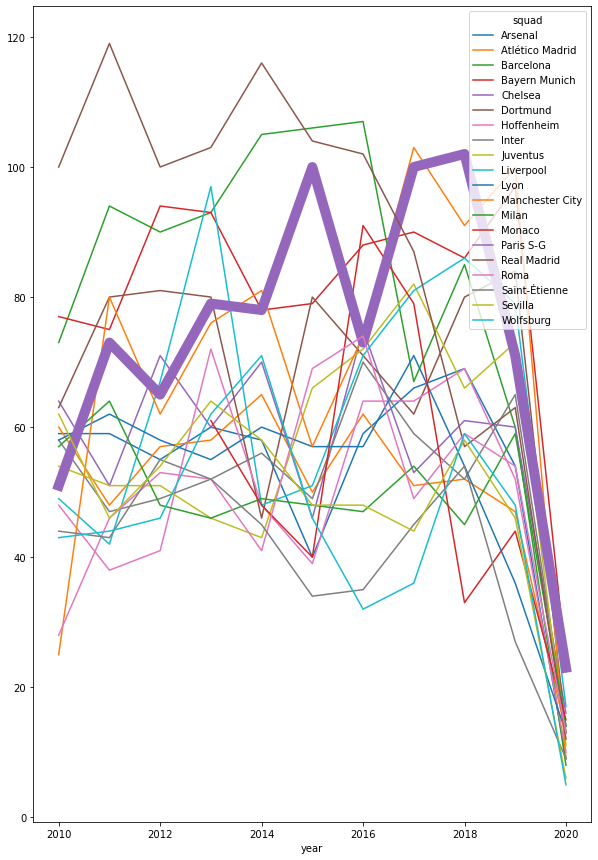

In [32]:
#plot
make_plot('gls')

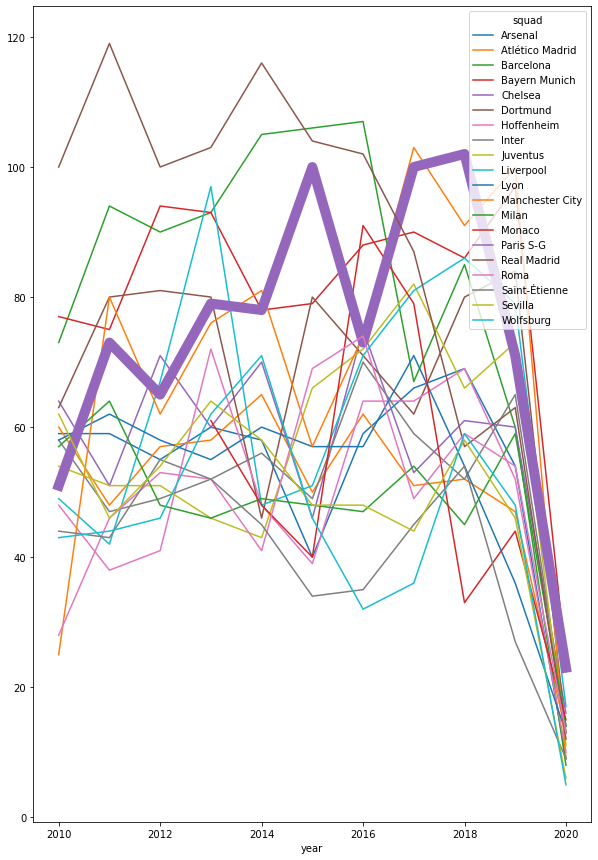

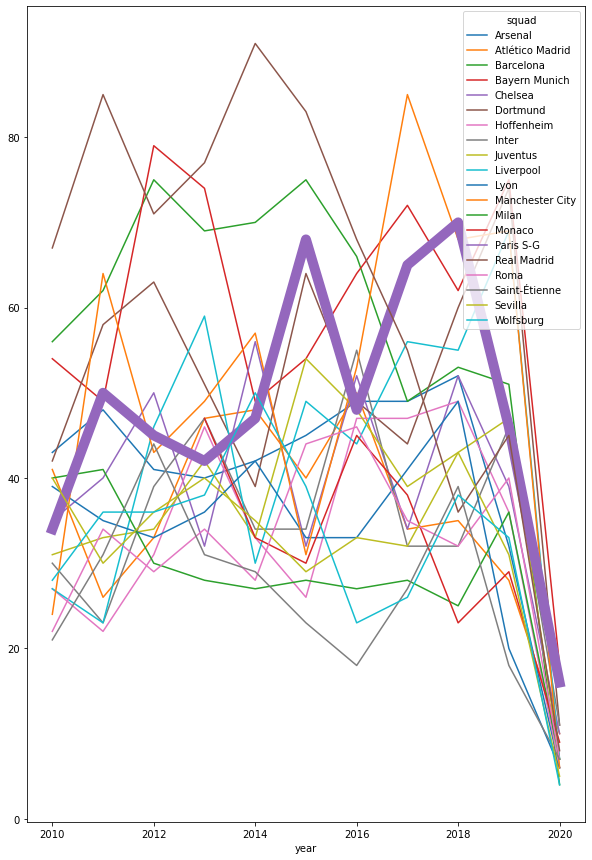

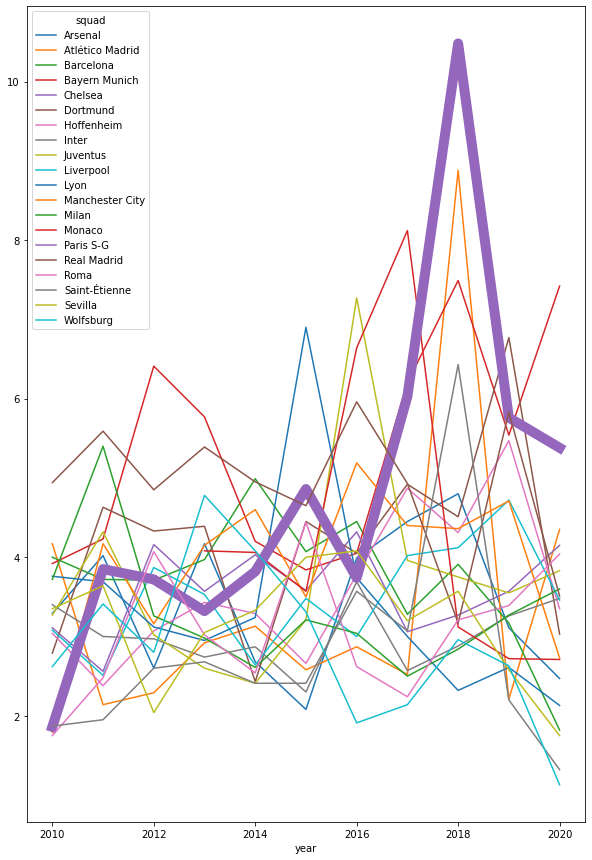

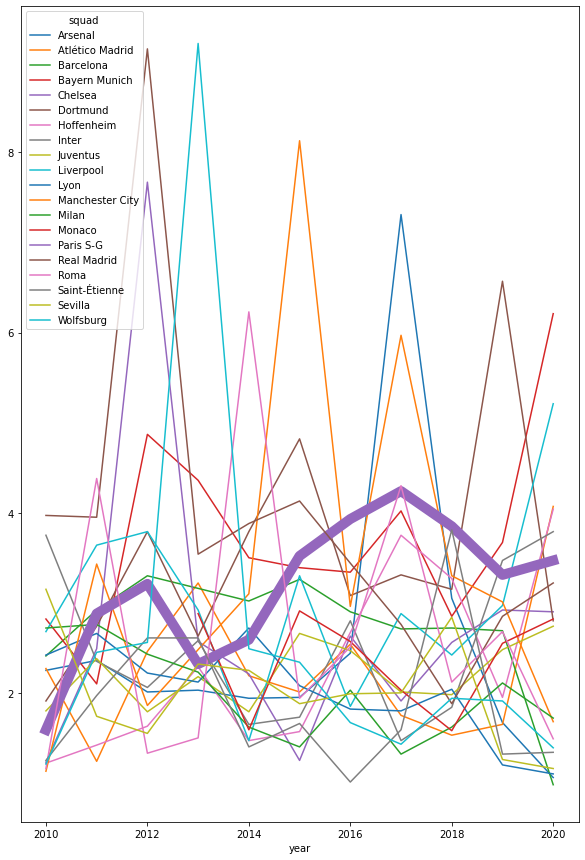

In [33]:
#tabs
gls = pn.Row(make_plot('gls'))
ast = pn.Row(make_plot('ast'))
gls_per_90 = pn.Row(make_plot('gls_per_90'))
ast_per_90 = pn.Row(make_plot('ast_per_90'))
plots_as_column = pn.Column(
   "Top Team Stat Comparison", gls, ast, gls_per_90, ast_per_90
)

In [34]:
# tabs3 = pn.Tabs(
#   ("All Comparison", plots_as_column),
#   ("Top Teams Goal Comparison", gls),
#   ("Top Teams Assists Comparison", ast),
#   ("Top Teams Goals per 90 min Comparison", gls_per_90),
#   ("Top Teams Assists per 90 min Comparison", ast_per_90)
#)
#tabs3

In [35]:
transfer_stats = pd.read_csv(csvpath7, encoding = "ISO-8859-1", engine='python')
transfer_stats.tail()

,player,squad,mp,starts,min,gls,ast,pk,pkatt,crdy,crdr,gls_per_90,ast_per_90,g_plus_a_per_90,g_minus_pk_per_90,year,league,transfer fee
121,Maxwell,Paris S-G,33,33,2933,2,3,0,0,2,0,0.06,0.09,0.15,0.06,2012,French,3500000
122,Maxwell,Paris S-G,24,23,2090,3,2,0,0,2,0,0.13,0.09,0.22,0.13,2013,French,3500000
123,Maxwell,Paris S-G,26,24,2164,3,3,0,0,1,0,0.12,0.12,0.25,0.12,2014,French,3500000
124,Maxwell,Paris S-G,28,24,2226,3,3,0,0,0,0,0.12,0.12,0.24,0.12,2015,French,3500000
125,Maxwell,Paris S-G,20,19,1713,0,6,0,0,0,0,0.00,0.32,0.32,0.00,2016,French,3500000


In [36]:
# data cleanup
transfer_stats = transfer_stats.drop(columns=['transfer fee'])
transfer_stats = transfer_stats.drop(columns=['year'])
transfer_stats['player'] = transfer_stats['player'].astype('str')
transfer_stats = transfer_stats.sort_index()
transfer_stats.head()
FW = 1
MD = 3
DF = 2
GK = 4

In [37]:
#position = transfer_stats.get_value('player','pos_num', takeable=False)
player_stats = transfer_stats.groupby('player').sum()
player_stats

,mp,starts,min,gls,ast,pk,pkatt,crdy,crdr,gls_per_90,ast_per_90,g_plus_a_per_90,g_minus_pk_per_90
player,,,,,,,,,,,,,
Alex,70,67,5952,6,1,0,0,10,0,0.30,0.07,0.37,0.30
Blaise Matuidi,203,161,14542,23,14,0,0,24,1,0.84,0.56,1.42,0.84
David Luiz,56,52,4620,3,2,0,0,10,0,0.12,0.09,0.21,0.12
Edinson Cavani,200,171,15058,138,23,20,25,19,1,5.60,1.01,6.60,4.72
Ezequiel Lavezzi,107,71,6061,22,5,0,0,7,1,1.41,0.24,1.64,1.41
Giovani Lo Celso,38,19,1869,4,2,0,0,3,0,0.20,0.10,0.30,0.20
Gonçalo Guedes,8,1,148,0,1,0,0,0,0,0.00,0.63,0.63,0.00
Gregory van der Wiel,89,79,7096,4,11,0,0,14,1,0.23,0.56,0.80,0.23
Grzegorz Krychowiak,11,7,659,0,0,0,0,2,0,0.00,0.00,0.00,0.00


In [38]:
#csvpath3 = Path("C:/Users/jwber/project_one/Resources/player_stats/player_sum_2.csv")
psg_player_stats = pd.read_csv(csvpath6, encoding = "ISO-8859-1", engine='python')
psg_player_stats.set_index(psg_player_stats['player'], inplace=True)
psg_player_stats = psg_player_stats.drop(columns=['player'])
psg_player_stats.head()

,mp,starts,min,gls,ast,pk,pkatt,crdy,crdr,gls_per_90,ast_per_90,g_plus_a_per_90,g_minus_pk_per_90,num_seasons,transfer_fee,pos,pos_num
player,,,,,,,,,,,,,,,,,
Ángel Di María,148,131,10925,48,58,1,2,7,1,2.25,2.70,4.95,2.21,6,63000000,FW,1
Alex,70,67,5952,6,1,0,0,10,0,0.30,0.07,0.37,0.30,3,5000000,DF,1
Blaise Matuidi,203,161,14542,23,14,0,0,24,1,0.84,0.56,1.42,0.84,7,8000000,MF,1
David Luiz,56,52,4620,3,2,0,0,10,0,0.12,0.09,0.21,0.12,3,49500000,DF,2
Edinson Cavani,200,171,15058,138,23,20,25,19,1,5.60,1.01,6.60,4.72,7,64500000,FW,1


In [39]:
# Slice by position
fw_sts = psg_player_stats[
    psg_player_stats['pos'] == 'FW'
]

mf_sts = psg_player_stats[
    psg_player_stats['pos'] == 'MF'
]

df_sts = psg_player_stats[
    psg_player_stats['pos'] == 'DF'
]

In [40]:
#forward transfer cost
fw_transfer = (fw_sts.iloc[:, 14]) 
fw_transfer_comparison = fw_transfer.hvplot.bar(title='Forward Transfer Cost', rot=90, figsize=(10,10))

In [41]:
#forward production
fw_prod = fw_sts.iloc[:, 3] + fw_sts.iloc[:, 4]
fw_prod_comparison = fw_prod.hvplot.bar(title='Forward Goals and Assists', rot=90, figsize=(10,10))

In [42]:
#midfield transfer
mf_transfer = mf_sts.iloc[:, 14]
mf_transfer_comparison = mf_transfer.hvplot.bar(title='Midfield Transfer Cost', rot=90, figsize=(10,10))

In [43]:
#midfield production
mf_prod = mf_sts.iloc[:, 3] + mf_sts.iloc[:, 4]
mf_prod_comparison = mf_prod.hvplot.bar(title='Midfield Goals and Assists', rot=90, figsize=(10,10))

In [44]:
# Transfer comparison
mf_vs_fw_cost = mf_transfer.hvplot.bar(label='Midfield Transfer Cost',rot=90) * fw_transfer.hvplot.bar(label='Forward Transfer Cost', rot=90)

In [45]:
#production comparison
mf_vs_fw_prod = mf_prod.hvplot.bar(label='Midfield G and A',rot=90) * fw_prod.hvplot.bar(label='Forward G and A',rot=90)

In [45]:
# Section 4 analysis of team finances vs. apple stock









In [46]:
#paneling player peformance for seed into main panel

row_fw = pn.Row(fw_transfer_comparison)
row_fw.append(fw_prod_comparison)
row_mf = pn.Row(mf_transfer_comparison)
row_mf.append(mf_prod_comparison)
row_fw_vs_mf = pn.Row(mf_vs_fw_cost)
row_fw_vs_mf.append(mf_vs_fw_prod)

column = pn.Column('# Player Cost Beneft Analysis By Player and Position',row_fw, row_mf, row_fw_vs_mf)

tabs1 = pn.Tabs(
    ("All Plots", column),
    ("Forward Cost and Production", row_fw),
    ("Midfield Cost and Production", row_mf),
    ("Forward Vs. Midfield Cost and Production", row_fw_vs_mf)
)



In [51]:
# create panel by relevant sections

row_of_charts = pn.Row(points_psg_vs_avg_plot, psg_vs_avg_plot)
row_of_charts_one = pn.Row(psg_vs_avg_gd_plot) 
row_of_charts_two = pn.Row(attendance_top_teams_table_plot)
row_of_charts_three = pn.Row(fig.show())



team_title = pn.Column(
m
)

transfer_market_column = pn.Column(
        row_of_charts_three
)

player_information_column = pn.Column(
    tabs1,
)

team_performance_column = pn.Column(
    "## Team Performance", 
    "Across European Soccer leagues, the winner of a given league is the team that collects the most points after playing a season (38 games) against "
    "it's competitors.  Three points are awarded for a wine, one point for a draw, and none for a defeat, with the team with the most ponts "
    "at the end of the season winning the league title. Using the 2013-2014 top 4 finishers as a becnhmark across five leagues, the below graph " 
    "is PSG's total points versus the top 4 competitors in each of the English, French, Spanish, German and Italian leagues.  PSG has over performed "    
    "its competitors since 2011. 2011 marked the first year after ownership of PSG changed hands and large scale investment in the transfer market begun. "
    "Looking at the data, you can see a consistent and accelerating uptick in the amount of points that PSG is winning.  Interestingly, PSG peers seem to have up "
    "and down seasons where PSG has been able to maintain a steady top level of performance",
    row_of_charts,
    "## Goal Differential",
    "Goal differential data is an important indicator of how well a team is performing. A team that is able to limit it's opponents goals by having "
    "strong defense and goalkeeping that is also able to pass and score more effectively have a significantly better chance of winning more games, "
    "and drawing more games against close competitors.  Generally, PSG is winning it's games by a lot larger margins than what its peers are doing. "
    "This demonstrates that the team that the team that PSG has put together is significantly more competitive and productive than the rest", 
    row_of_charts_one,    
    "##Attendance",
    "Interesting to note the increase in attendance of fans at home stadium in Paris as the team begins to perform better. This is an indicator of "
    "increased revenue for the team which it can funnel back into developing and transferring more high quality players",
    row_of_charts_two,    
)

analysis_column = pn.Column(
# Insert comparison and analysis

)

team_performance_dashboard = pn.Tabs(
    ("Team Focus", team_title), ("Transfer Market Information", transfer_market_column), ("Player Performance", player_information_column), ("Team Performance", team_performance_column),
    ("Analysis", analysis_column)
)


NameError: name 'm' is not defined

In [52]:
team_performance_dashboard

Tabs
    [0] Column()
    [1] Column
        [0] Row
            [0] Str(None)
    [2] Column
        [0] Tabs
            [0] Column
                [0] Markdown(str)
                [1] Row
                    [0] HoloViews(Bars)
                    [1] HoloViews(Bars)
                [2] Row
                    [0] HoloViews(Bars)
                    [1] HoloViews(Bars)
                [3] Row
                    [0] HoloViews(Overlay)
                    [1] HoloViews(Overlay)
            [1] Row
                [0] HoloViews(Bars)
                [1] HoloViews(Bars)
            [2] Row
                [0] HoloViews(Bars)
                [1] HoloViews(Bars)
            [3] Row
                [0] HoloViews(Overlay)
                [1] HoloViews(Overlay)
    [3] Column
        [0] Markdown(str)
        [1] Markdown(str)
        [2] Row
            [0] HoloViews(NdOverlay)
            [1] HoloViews(NdOverlay)
        [3] Markdown(str)
        [4] Markdown(str)
        [5] Row
            [0] HoloViews(NdOverlay)
        [6] Markdown(str)
        [7] Markdown(str)
        [8] Row
            [0] HoloViews(Scatter)
    [4] Column()